In [1]:
# Block 1
import os
import sys
file_path = os.path.abspath('./utils')
print(file_path)
sys.path.append(file_path)
import CommonUtil as cu    # ct_win

import glob
import h5py
import cv2
import numpy as np

from tqdm import tqdm, tqdm_notebook
import shutil
import json
import SimpleITK as sitk
import matplotlib.pylab as plt
from skimage.transform import resize
from datetime import datetime, timedelta, timezone
import nibabel as nib
import SimpleITK as sitk
import pydicom

/home/gil/gcubme_ai2/Workspace/SB_MUN/19_liver/4_참고자료/1_source/utils


# Windowing : WW와 WL을 변경하는 프로세스
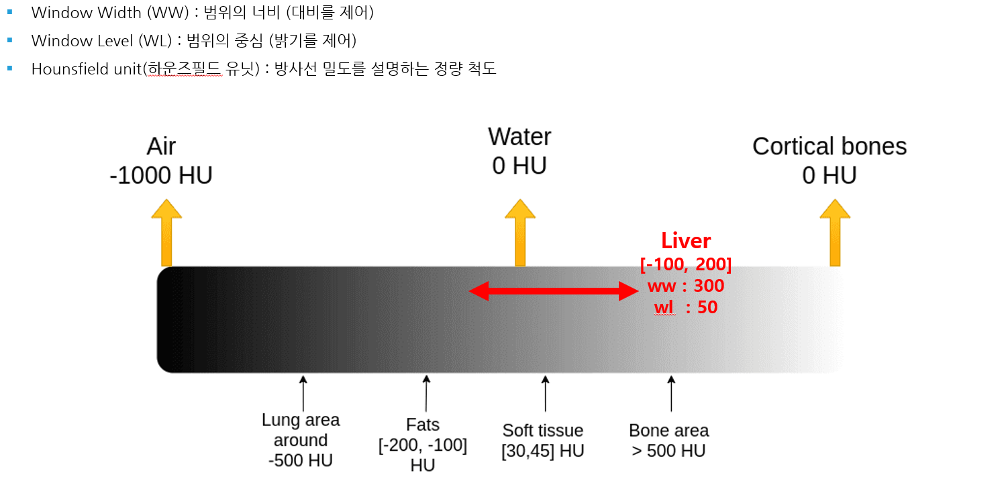
<!-- <div style="width: 100%">
    <img src="https://kevalnagda.github.io/assets/img/windowing/3.png" style="width:60%; display:block; margin:auto">
    <p></p>
    <p>Window Width (WW) : 범위의 너비 (대비를 제어)</p>
    <p>Window Level (WL) : 범위의 중심 (밝기를 제어)</p>
</div> -->

In [2]:
# Block 2
win_level = 50
win_width = 300

width = 128
height = 128
channel = 1

# data path 가져오기

# 학습에 사용된 데이터
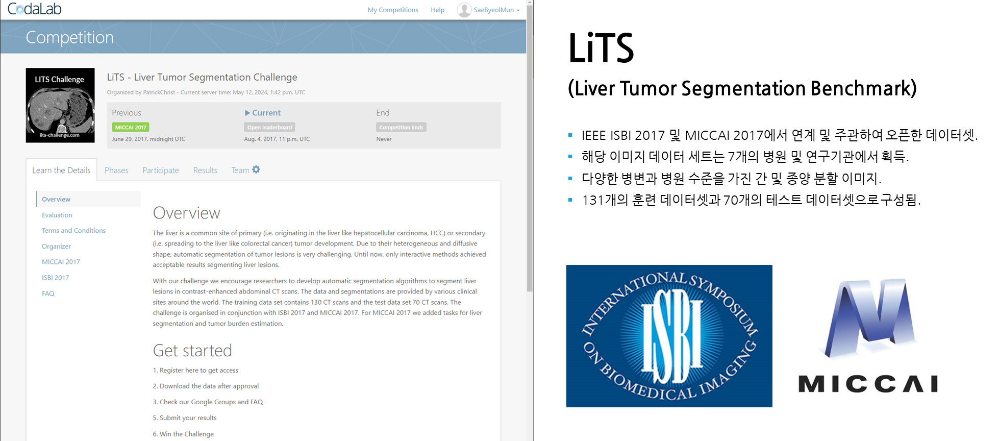

In [3]:
# Block 3
ct__dir = os.path.abspath('../0_data/data_origin/volume')
lab_dir = os.path.abspath('../0_data/data_origin/segmentation')

save_dir = os.path.abspath('../0_data/data_preprocessing')
os.makedirs(save_dir, exist_ok=True)

print(ct__dir)
print(lab_dir)
print(save_dir)


/home/gil/gcubme_ai2/Workspace/SB_MUN/19_liver/4_참고자료/0_data/data_origin/volume
/home/gil/gcubme_ai2/Workspace/SB_MUN/19_liver/4_참고자료/0_data/data_origin/segmentation
/home/gil/gcubme_ai2/Workspace/SB_MUN/19_liver/4_참고자료/0_data/data_preprocessing


# CT (컴퓨터 단층촬영)
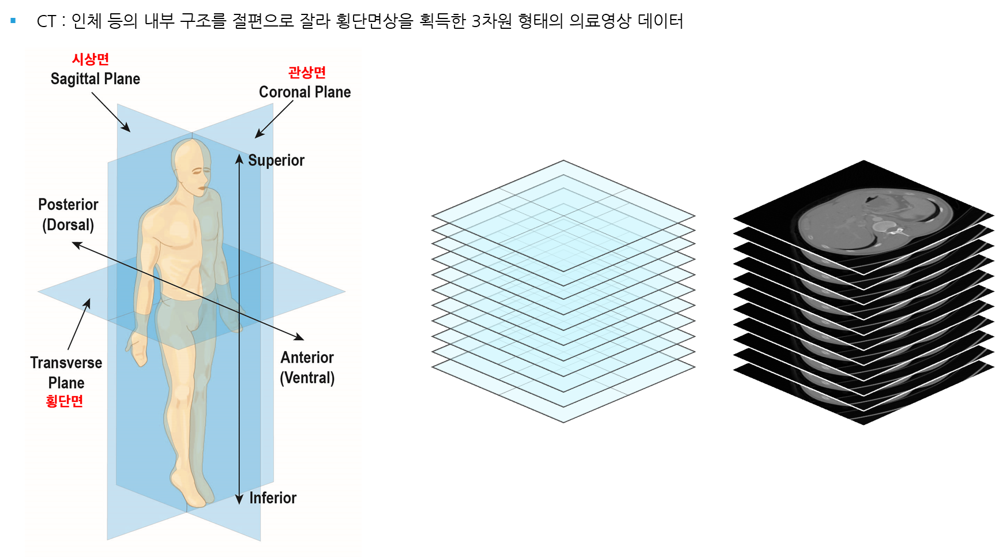

In [4]:
# Block 4
ct__list = sorted(glob.glob(f'{ct__dir}/*.nii'))
lab_list = [path.replace('volume', 'segmentation') for path in ct__list]

print(len(ct__list), ct__list[0])
print(len(lab_list), lab_list[0])

for i in range(len(ct__list)):
    check__ct = os.path.isfile(ct__list[i])
    check_lab = os.path.isfile(lab_list[i])
    if check__ct and check_lab:
        continue
    else:
        print(check__ct, ct__list[i])
        print(check_lab, lab_list[i])
    

5 /home/gil/gcubme_ai2/Workspace/SB_MUN/19_liver/4_참고자료/0_data/data_origin/volume/volume-0.nii
5 /home/gil/gcubme_ai2/Workspace/SB_MUN/19_liver/4_참고자료/0_data/data_origin/segmentation/segmentation-0.nii


# 데이터 전처리 
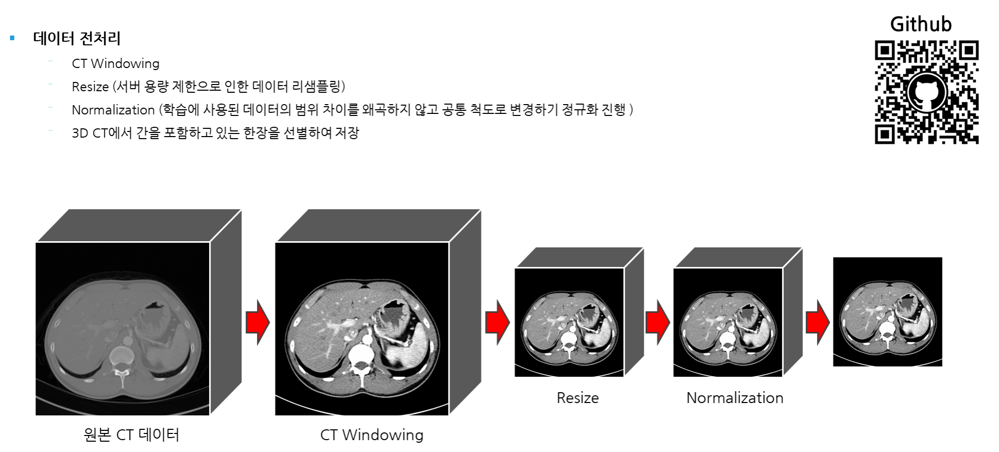

In [5]:
# Block 5
cto_data = []
ct__data = []
lab_data = []
# for a in tqdm_notebook(range(len(ct__list))):
for a in tqdm_notebook(range(5)):
    ct_ = sitk.ReadImage(ct__list[a])
    lab = sitk.ReadImage(lab_list[a])
    # 파일을 이미지타입의 이미지로 읽는다.

    cto_array = sitk.GetArrayFromImage(ct_)
    lab_array = sitk.GetArrayFromImage(lab)   
    # 이미지타입의 이미지를 배열타입의 이미지로 읽는다.
    
    ct__array = cu.win_scale(cto_array, win_level, win_width, np.uint8, (0, 255))
    
    print(cto_array.shape, np.min(cto_array), np.max(cto_array))
    print(ct__array.shape, np.min(ct__array), np.max(ct__array))
    print(lab_array.shape, np.min(lab_array), np.max(lab_array))
    
    cto_data.append(cto_array)
    ct__data.append(ct__array)
    lab_data.append(lab_array)

# ct__data = np.array(ct__data)
# lab_data = np.array(lab_data)

# print(ct__data.shape, np.min(ct__data), np.max(ct__data))
# print(lab_data.shape, np.min(lab_data), np.max(lab_data))


/tmp/ipykernel_292303/995079483.py:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for a in tqdm_notebook(range(5)):


  0%|          | 0/5 [00:00<?, ?it/s]

(75, 512, 512) -3024.0 1410.0
(75, 512, 512) 0 255
(75, 512, 512) 0 2
(123, 512, 512) -3024.0 3071.0
(123, 512, 512) 0 255
(123, 512, 512) 0 2
(517, 512, 512) -1024.0 3071.0
(517, 512, 512) 0 255
(517, 512, 512) 0 2
(534, 512, 512) -1024.0 1674.0
(534, 512, 512) 0 255
(534, 512, 512) 0 2
(841, 512, 512) -3024.0 3071.0
(841, 512, 512) 0 255
(841, 512, 512) 0 2


/tmp/ipykernel_292303/1578095246.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12, 12))


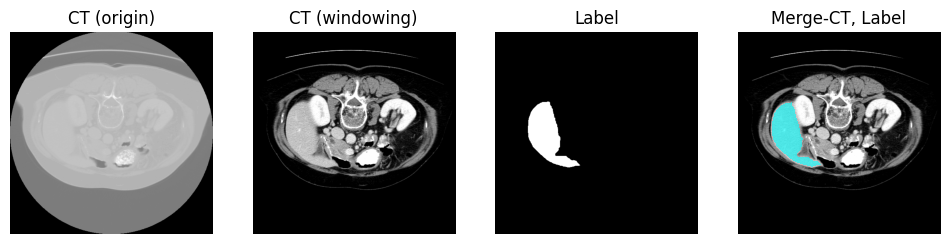

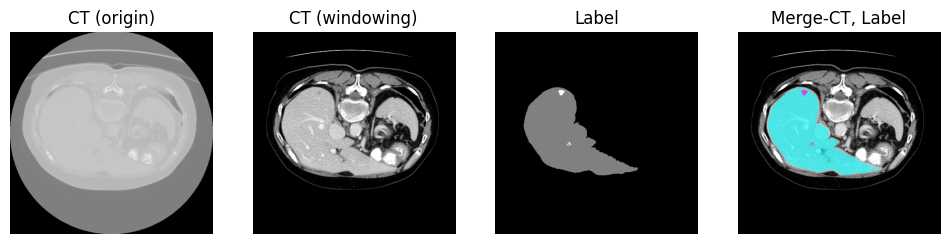

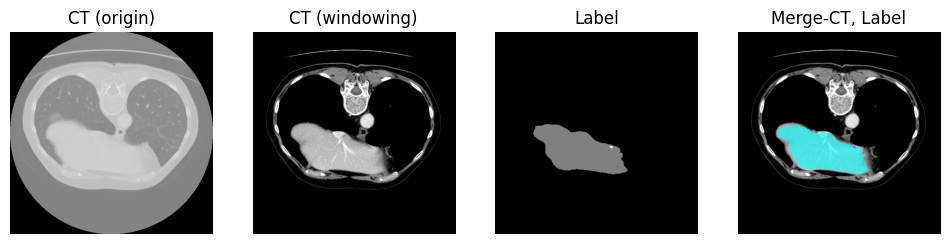

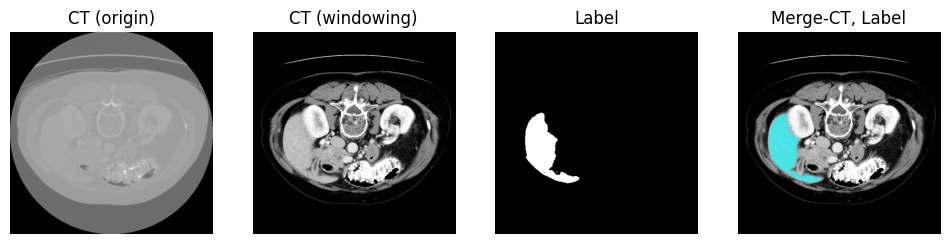

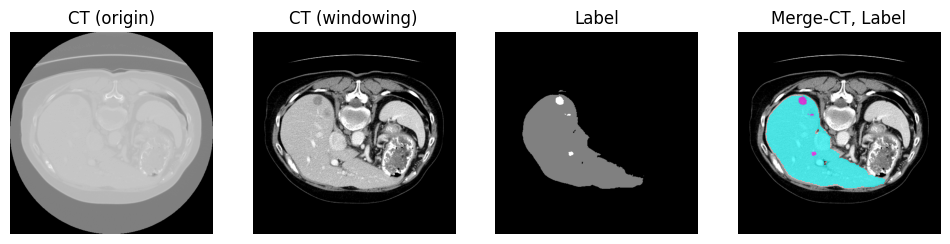

...

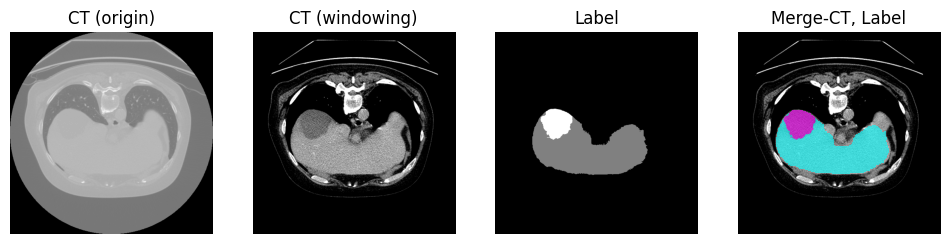

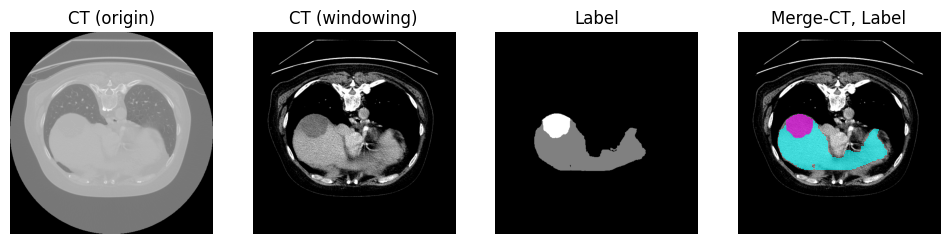

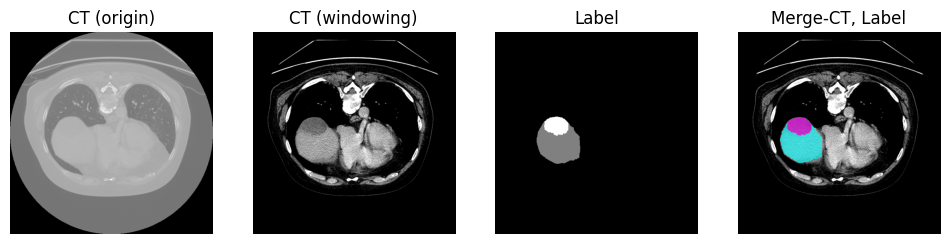

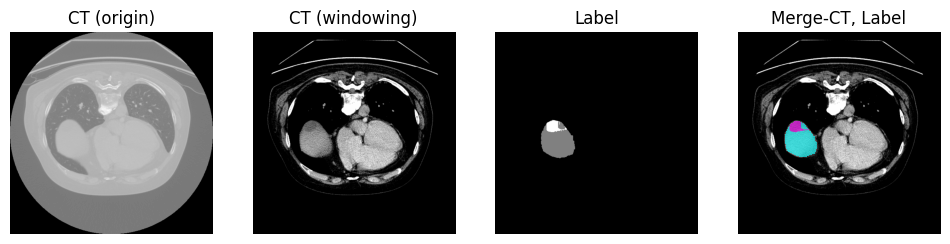

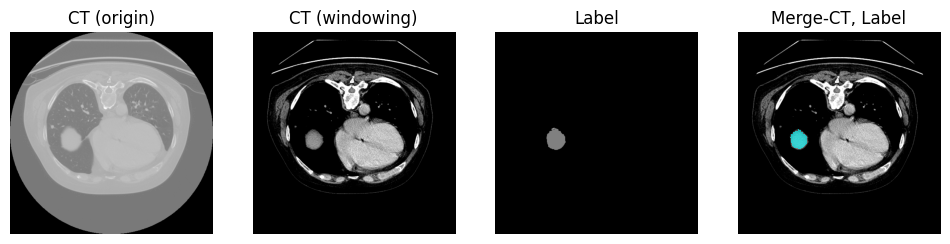

In [6]:
# Block 6
for i in range(0, len(ct__data)):
    for j in range(0, len(ct__data[i]), 10):
        o_img = cto_data[i][j,:,:]
        image = ct__data[i][j,:,:]
        label = lab_data[i][j,:,:]
        if np.sum(label) > 0: 
            fig = plt.figure(figsize=(12, 12))
            
            ax1 = fig.add_subplot(2,4,1)
            ax1.imshow(o_img,cmap='gray')
            ax1.axis('off')
            ax1.set_title(f'CT (origin)')
            
            ax2 = fig.add_subplot(2,4,2)
            ax2.imshow(image,cmap='gray')
            ax2.axis('off')
            ax2.set_title(f'CT (windowing)')
            
            ax3 = fig.add_subplot(2,4,3)
            ax3.imshow(label,cmap='gray')
            ax3.axis('off')
            ax3.set_title('Label')
            
            ax4 = fig.add_subplot(2,4,4)
            ax4.imshow(image,cmap='gray')
            tmpMask = label
            maskedRegion = np.ma.masked_where(tmpMask == 0, tmpMask)
            ax4.imshow(maskedRegion,cmap='cool' ,alpha=0.6)
            ax4.axis('off')
            ax4.set_title('Merge-CT, Label')